In [1]:
import pandas as pd
import numpy as np
import re
import matplotlib.pyplot as plt 
import pandas as pd 
import plotly.express as px
import matplotlib.pyplot as plt 
import seaborn as sns

Cargar datos

In [2]:
#Cargar Dataframe
location='Hotel_Reviews.csv'
df = pd.read_csv(location,index_col=0)
#Informacion del Dataframe
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 515738 entries,  s Gravesandestraat 55 Oost 1092 AA Amsterdam Netherlands to Wurzbachgasse 21 15 Rudolfsheim F nfhaus 1150 Vienna Austria
Data columns (total 16 columns):
 #   Column                                      Non-Null Count   Dtype  
---  ------                                      --------------   -----  
 0   Additional_Number_of_Scoring                515738 non-null  int64  
 1   Review_Date                                 515738 non-null  object 
 2   Average_Score                               515738 non-null  float64
 3   Hotel_Name                                  515738 non-null  object 
 4   Reviewer_Nationality                        515738 non-null  object 
 5   Negative_Review                             515738 non-null  object 
 6   Review_Total_Negative_Word_Counts           515738 non-null  int64  
 7   Total_Number_of_Reviews                     515738 non-null  int64  
 8   Positive_Review                        

Obtener información adicional desde campo Tags

In [3]:
#Obtener cantidad de noches
patron='\d?\s?Stayed\w?\s?\d?'
regex=re.compile(patron,flags=re.IGNORECASE)

nights=df['Tags'].astype(str).apply(lambda x: regex.search(x))
nights1 = nights.apply(lambda x: x if x is None else x.group(0) )


In [4]:
#Eliminar caracteres no numericos
nights1.replace("\Stayed","", regex=True, inplace=True)

In [5]:
#Insertar Cantidad de noches obtenido de la columna Tags 
DFnights1  = pd.DataFrame(pd.to_numeric(nights1, errors='coerce'))

df['Qty_Nights']=DFnights1

In [6]:
#Obtener Tipo de Viaje
patron='\d?\s?Leisure\w?\s?\d?|\d?\s?Business\w?\s?\d?'
regex=re.compile(patron,flags=re.IGNORECASE)

TripType=df['Tags'].astype(str).apply(lambda x: regex.search(x))

TripType1 = TripType.apply(lambda x: x if x is None else x.group(0) )

In [7]:
#Insertar Tipo de Viaje obtenido de la columna Tags 
df['Trip_Type']=TripType1

In [8]:
#Obtener Acompañantes
patron='\d?\s?Couple\w?\s?\d?|\d?\s?Group\w?\s?\d?|\d?\s?Solo Traveler\w?\s?\d?|\d?\s?Family with older children\w?\s?\d?|\d?\s?Family with young children\w?\s?\d?|\d?\s?Travelers with friends\w?\s?\d?' 
regex=re.compile(patron,flags=re.IGNORECASE)

Acompañantes=df['Tags'].astype(str).apply(lambda x: regex.search(x))

Acompañantes1 = Acompañantes.apply(lambda x: x if x is None else x.group(0) )


In [9]:
#Insertar Acompañantes obtenido de la columna Tags 
df['Travelers']=Acompañantes1

Eliminar valores NULL

In [10]:
df.dropna(axis=0, how='any', inplace=True)

In [11]:
df.head(25)

,Additional_Number_of_Scoring,Review_Date,Average_Score,Hotel_Name,Reviewer_Nationality,Negative_Review,Review_Total_Negative_Word_Counts,Total_Number_of_Reviews,Positive_Review,Review_Total_Positive_Word_Counts,Total_Number_of_Reviews_Reviewer_Has_Given,Reviewer_Score,Tags,days_since_review,lat,lng,Qty_Nights,Trip_Type,Travelers
Hotel_Address,,,,,,,,,,,,,,,,,,,
s Gravesandestraat 55 Oost 1092 AA Amsterdam Netherlands,194,8/3/2017,7.7,Hotel Arena,Russia,I am so angry that i made this post available...,397,1403,Only the park outside of the hotel was beauti...,11,7,2.9,"[' Leisure trip ', ' Couple ', ' Duplex Double...",0 days,52.360576,4.915968,6.0,Leisure,Couple
s Gravesandestraat 55 Oost 1092 AA Amsterdam Netherlands,194,8/3/2017,7.7,Hotel Arena,Ireland,No Negative,0,1403,No real complaints the hotel was great great ...,105,7,7.5,"[' Leisure trip ', ' Couple ', ' Duplex Double...",0 days,52.360576,4.915968,4.0,Leisure,Couple
s Gravesandestraat 55 Oost 1092 AA Amsterdam Netherlands,194,7/31/2017,7.7,Hotel Arena,Australia,Rooms are nice but for elderly a bit difficul...,42,1403,Location was good and staff were ok It is cut...,21,9,7.1,"[' Leisure trip ', ' Family with young childre...",3 days,52.360576,4.915968,3.0,Leisure,Family with young children
s Gravesandestraat 55 Oost 1092 AA Amsterdam Netherlands,194,7/31/2017,7.7,Hotel Arena,United Kingdom,My room was dirty and I was afraid to walk ba...,210,1403,Great location in nice surroundings the bar a...,26,1,3.8,"[' Leisure trip ', ' Solo traveler ', ' Duplex...",3 days,52.360576,4.915968,3.0,Leisure,Solo traveler
s Gravesandestraat 55 Oost 1092 AA Amsterdam Netherlands,194,7/24/2017,7.7,Hotel Arena,New Zealand,You When I booked with your company on line y...,140,1403,Amazing location and building Romantic setting,8,3,6.7,"[' Leisure trip ', ' Couple ', ' Suite ', ' St...",10 days,52.360576,4.915968,2.0,Leisure,Couple
s Gravesandestraat 55 Oost 1092 AA Amsterdam Netherlands,194,7/24/2017,7.7,Hotel Arena,Poland,Backyard of the hotel is total mess shouldn t...,17,1403,Good restaurant with modern design great chil...,20,1,6.7,"[' Leisure trip ', ' Group ', ' Duplex Double ...",10 days,52.360576,4.915968,1.0,Leisure,Group
s Gravesandestraat 55 Oost 1092 AA Amsterdam Netherlands,194,7/17/2017,7.7,Hotel Arena,United Kingdom,Cleaner did not change our sheet and duvet ev...,33,1403,The room is spacious and bright The hotel is ...,18,6,4.6,"[' Leisure trip ', ' Group ', ' Duplex Twin Ro...",17 days,52.360576,4.915968,5.0,Leisure,Group
s Gravesandestraat 55 Oost 1092 AA Amsterdam Netherlands,194,7/17/2017,7.7,Hotel Arena,United Kingdom,Apart from the price for the brekfast Everyth...,11,1403,Good location Set in a lovely park friendly s...,19,1,10.0,"[' Leisure trip ', ' Couple ', ' Duplex Double...",17 days,52.360576,4.915968,2.0,Leisure,Couple
s Gravesandestraat 55 Oost 1092 AA Amsterdam Netherlands,194,7/9/2017,7.7,Hotel Arena,Belgium,Even though the pictures show very clean room...,34,1403,No Positive,0,3,6.5,"[' Leisure trip ', ' Couple ', ' Duplex Double...",25 days,52.360576,4.915968,1.0,Leisure,Couple


In [12]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 497408 entries,  s Gravesandestraat 55 Oost 1092 AA Amsterdam Netherlands to Wurzbachgasse 21 15 Rudolfsheim F nfhaus 1150 Vienna Austria
Data columns (total 19 columns):
 #   Column                                      Non-Null Count   Dtype  
---  ------                                      --------------   -----  
 0   Additional_Number_of_Scoring                497408 non-null  int64  
 1   Review_Date                                 497408 non-null  object 
 2   Average_Score                               497408 non-null  float64
 3   Hotel_Name                                  497408 non-null  object 
 4   Reviewer_Nationality                        497408 non-null  object 
 5   Negative_Review                             497408 non-null  object 
 6   Review_Total_Negative_Word_Counts           497408 non-null  int64  
 7   Total_Number_of_Reviews                     497408 non-null  int64  
 8   Positive_Review                        

In [ ]:
df_hotel_reviews=df

In [14]:
df_hotel_reviews.head(5)

,Additional_Number_of_Scoring,Review_Date,Average_Score,Hotel_Name,Reviewer_Nationality,Negative_Review,Review_Total_Negative_Word_Counts,Total_Number_of_Reviews,Positive_Review,Review_Total_Positive_Word_Counts,Total_Number_of_Reviews_Reviewer_Has_Given,Reviewer_Score,Tags,days_since_review,lat,lng,Qty_Nights,Trip_Type,Travelers
Hotel_Address,,,,,,,,,,,,,,,,,,,
s Gravesandestraat 55 Oost 1092 AA Amsterdam Netherlands,194,8/3/2017,7.7,Hotel Arena,Russia,I am so angry that i made this post available...,397,1403,Only the park outside of the hotel was beauti...,11,7,2.9,"[' Leisure trip ', ' Couple ', ' Duplex Double...",0 days,52.360576,4.915968,6.0,Leisure,Couple
s Gravesandestraat 55 Oost 1092 AA Amsterdam Netherlands,194,8/3/2017,7.7,Hotel Arena,Ireland,No Negative,0,1403,No real complaints the hotel was great great ...,105,7,7.5,"[' Leisure trip ', ' Couple ', ' Duplex Double...",0 days,52.360576,4.915968,4.0,Leisure,Couple
s Gravesandestraat 55 Oost 1092 AA Amsterdam Netherlands,194,7/31/2017,7.7,Hotel Arena,Australia,Rooms are nice but for elderly a bit difficul...,42,1403,Location was good and staff were ok It is cut...,21,9,7.1,"[' Leisure trip ', ' Family with young childre...",3 days,52.360576,4.915968,3.0,Leisure,Family with young children
s Gravesandestraat 55 Oost 1092 AA Amsterdam Netherlands,194,7/31/2017,7.7,Hotel Arena,United Kingdom,My room was dirty and I was afraid to walk ba...,210,1403,Great location in nice surroundings the bar a...,26,1,3.8,"[' Leisure trip ', ' Solo traveler ', ' Duplex...",3 days,52.360576,4.915968,3.0,Leisure,Solo traveler
s Gravesandestraat 55 Oost 1092 AA Amsterdam Netherlands,194,7/24/2017,7.7,Hotel Arena,New Zealand,You When I booked with your company on line y...,140,1403,Amazing location and building Romantic setting,8,3,6.7,"[' Leisure trip ', ' Couple ', ' Suite ', ' St...",10 days,52.360576,4.915968,2.0,Leisure,Couple


In [ ]:
#Puntaje promedio de los hoteles
df_uni = df_hotel_reviews[['Hotel_Name','Average_Score']].drop_duplicates()
plt.figure(figsize = (14,6))
sns.countplot(x = 'Puntaje Promedio',data = df_uni,color = 'orange')

In [17]:
df_hotel_reviews.Reviewer_Score.describe().T

count    497408.000000
mean          8.404038
std           1.631200
min           2.500000
25%           7.500000
50%           8.800000
75%           9.600000
max          10.000000
Name: Reviewer_Score, dtype: float64

In [33]:
fig = px.histogram(df_hotel_reviews, x="Reviewer_Score", title='Distribucion de Reviews', nbins=35, text_auto=True)
fig.show()

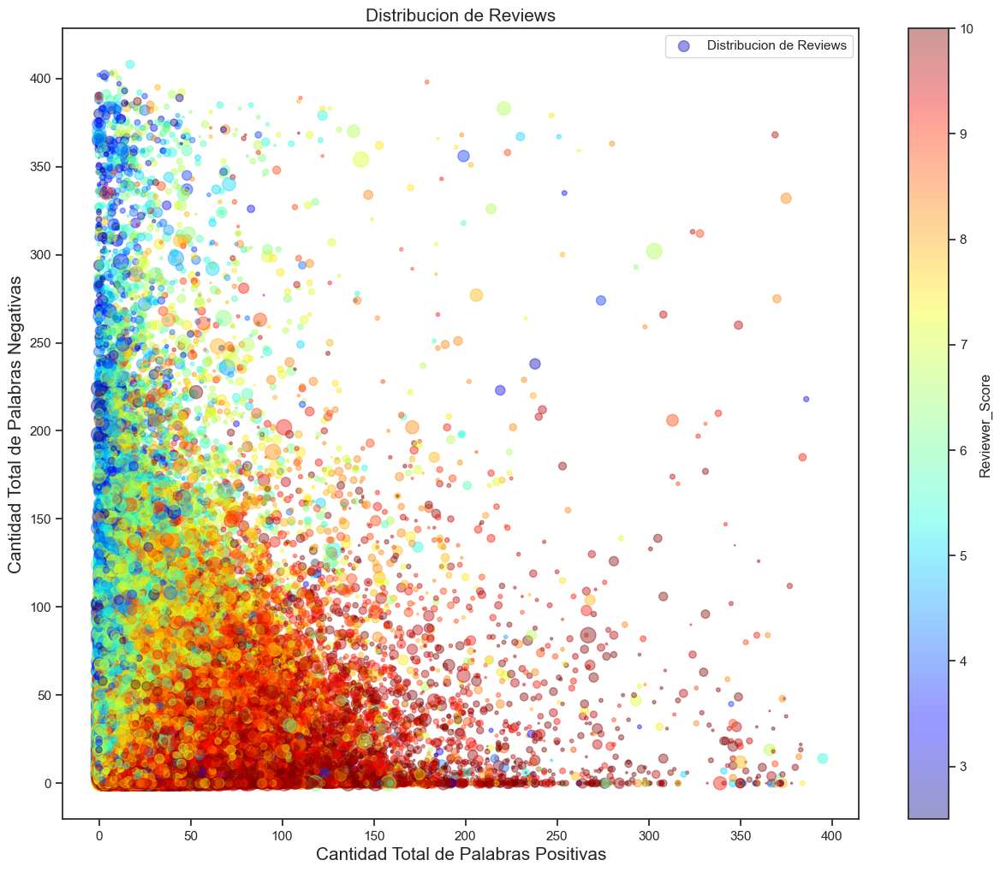

In [43]:
df_hotel_reviews.plot(kind='scatter', x='Review_Total_Positive_Word_Counts', y='Review_Total_Negative_Word_Counts',
                      label='Distribucion de Reviews',s=df_hotel_reviews.Total_Number_of_Reviews/100,c='Reviewer_Score',
                      cmap=plt.get_cmap('jet'), colorbar=True,alpha=0.4, figsize=(15,12))
font_size = 15
plt.title("Distribucion de Reviews",  fontsize=font_size)
plt.xlabel("Cantidad Total de Palabras Positivas", fontsize=font_size)
plt.ylabel("Cantidad Total de Palabras Negativas",  fontsize=font_size)

plt.show()




In [20]:
#Nacionalidades de los huespedes
df_hotel_reviews.Reviewer_Nationality.value_counts()[:20]

 United Kingdom               237532
 United States of America      34526
 Australia                     21213
 Ireland                       14366
 United Arab Emirates           9806
 Saudi Arabia                   8562
 Netherlands                    8421
 Switzerland                    8375
 Canada                         7685
 Germany                        7613
 France                         6978
 Israel                         6361
 Belgium                        5835
 Italy                          5794
 Turkey                         5192
 Kuwait                         4598
 Spain                          4448
 Romania                        4228
 South Africa                   3750
 Russia                         3732
Name: Reviewer_Nationality, dtype: int64

In [35]:
'''Puntajes promedios para los hoteles'''
puntaje_promedio = df_hotel_reviews.groupby(['Hotel_Name','Average_Score'], as_index=False).mean('Average_Score')
puntaje_promedio.sort_values('Average_Score',ascending=False)
puntaje_promedio

,Hotel_Name,Average_Score,Additional_Number_of_Scoring,Review_Total_Negative_Word_Counts,Total_Number_of_Reviews,Review_Total_Positive_Word_Counts,Total_Number_of_Reviews_Reviewer_Has_Given,Reviewer_Score,lat,lng,Qty_Nights
0,11 Cadogan Gardens,8.7,101.0,15.443038,393.0,19.677215,7.265823,8.837975,51.493616,-0.159235,2.278481
1,1K Hotel,7.7,69.0,25.102740,663.0,15.801370,9.205479,7.894521,48.863932,2.365874,2.746575
2,25hours Hotel beim MuseumsQuartier,8.8,391.0,16.141384,4324.0,21.997054,8.711340,8.974963,48.206474,16.354630,2.534610
3,41,9.6,66.0,8.970297,244.0,25.623762,5.970297,9.709901,51.498147,-0.143649,2.306931
4,45 Park Lane Dorchester Collection,9.4,27.0,7.192308,68.0,11.500000,7.423077,9.588462,51.506371,-0.151536,2.500000
...,...,...,...,...,...,...,...,...,...,...,...
1471,citizenM London Bankside,9.1,804.0,13.874412,3802.0,20.898590,9.769644,9.115111,51.505151,-0.100472,1.852250
1472,citizenM London Shoreditch,9.1,500.0,14.499389,2113.0,21.482295,8.312576,9.096581,51.524137,-0.078698,1.824176
1473,citizenM Tower of London,9.1,832.0,15.554341,4672.0,24.485124,9.374621,9.135216,51.510237,-0.076443,2.067395
1474,every hotel Piccadilly,8.8,326.0,13.050725,1685.0,16.322464,6.505435,8.960870,51.510146,-0.131506,2.260870


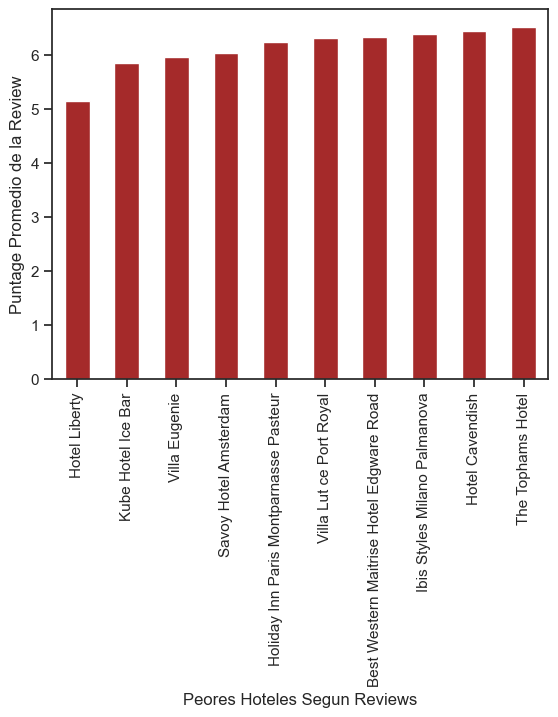

In [34]:
#Peores Hoteles
peores_hotels =df_hotel_reviews.groupby('Hotel_Name')['Reviewer_Score'].mean().sort_values(ascending=True).head(10)
peores_hotels.plot(kind="bar",color="brown")
_=plt.xlabel('Peores Hoteles Segun Reviews')
_=plt.ylabel('Puntage Promedio de la Review')
plt.show()

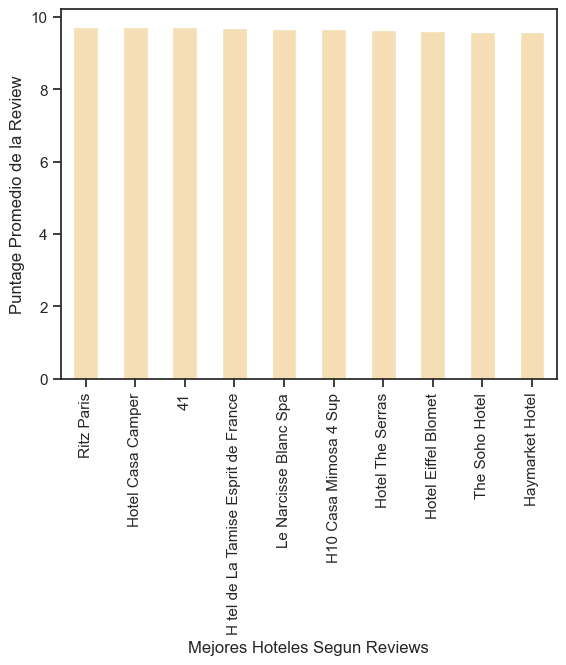

In [47]:
#Mejores Hoteles
mejores_hoteles = df_hotel_reviews.groupby('Hotel_Name')['Reviewer_Score'].mean().sort_values(ascending=False).head(10)
mejores_hoteles.plot(kind="bar",color = "wheat")
_=plt.xlabel('Mejores Hoteles Segun Reviews')
_=plt.ylabel('Puntage Promedio de la Review')
plt.show()

In [48]:
#Ratings por Nacionalidades
rating_nacionalidades = df_hotel_reviews.groupby(['Reviewer_Nationality'], as_index=False).mean('Average_Score')
rating_nacionalidades.sort_values('Average_Score',ascending=False)

,Reviewer_Nationality,Additional_Number_of_Scoring,Average_Score,Review_Total_Negative_Word_Counts,Total_Number_of_Reviews,Review_Total_Positive_Word_Counts,Total_Number_of_Reviews_Reviewer_Has_Given,Reviewer_Score,lat,lng,Qty_Nights
39,Cape Verde,623.000000,9.000000,0.000000,2750.000000,51.000000,2.000000,9.600000,51.510462,-0.079550,4.000000
74,French Polynesia,84.500000,8.950000,3.000000,615.000000,10.000000,8.000000,8.950000,48.874068,2.346259,2.000000
170,Saint Kitts and Nevis,339.555556,8.922222,6.555556,1870.888889,7.777778,10.444444,8.588889,48.938515,3.603573,3.888889
47,Congo,118.666667,8.833333,5.666667,909.333333,11.000000,21.333333,9.166667,46.381290,2.283482,3.666667
68,Falkland Islands Malvinas,495.600000,8.800000,54.200000,2248.200000,24.000000,1.800000,8.520000,51.506963,-0.146221,5.200000
...,...,...,...,...,...,...,...,...,...,...,...
150,Northern Mariana Islands,252.000000,7.900000,11.000000,3130.000000,0.000000,1.000000,5.800000,41.396927,2.192267,8.000000
173,Saint Vincent Grenadines,1072.500000,7.900000,9.000000,5382.500000,30.500000,1.000000,8.350000,51.938629,2.352469,6.000000
82,Grenada,471.666667,7.766667,24.333333,2193.666667,15.666667,3.666667,7.800000,51.534422,-0.130157,2.000000
76,Gambia,725.000000,7.625000,1.000000,6666.500000,7.000000,2.500000,9.700000,50.233373,3.434162,4.000000


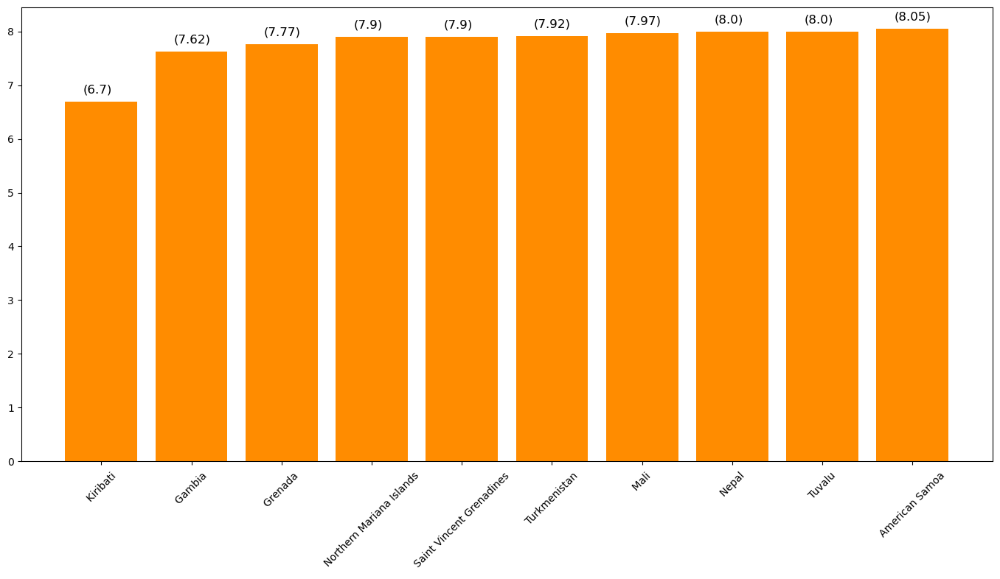

In [26]:
#Reviewers que dieron peores puntajes por pais
xAx=Rating_Frame_2.sort_values('Average_Score',ascending=True)['Reviewer_Nationality'].head(10)
yAx=Rating_Frame_2.sort_values('Average_Score',ascending=True)['Average_Score'].head(10)
plt.figure(figsize=(17,8))
plt.bar(xAx,yAx,color='darkorange')
plt.xticks(rotation = 45)
x=0.0
for xItem, yItem in zip(xAx,yAx):
    
    plt.text(x-0.2,yItem+0.22, '({})'.format(round(yItem,2)),fontsize=12,
             verticalalignment='center')
    x=x+1

In [51]:
#Numero de huspedes por pais
nacionalidad = pd.DataFrame(df_hotel_reviews["Reviewer_Nationality"].value_counts())
nacionalidad.rename(columns={"Reviewer_Nationality": "Numero_huespedes"}, inplace=True)
total_huespedes = nacionalidad["Numero_huespedes"].sum()
nacionalidad["Huespedes en %"] = round(nacionalidad["Numero_huespedes"] / total_huespedes * 100, 2)
nacionalidad["pais"] = nacionalidad.index
nacionalidad['media_puntaje'] = df.groupby(["Reviewer_Nationality"]).Reviewer_Score.mean()
nacionalidad.loc[nacionalidad["Huespedes en %"] < 1, "pais"] = "Other"

# grafico  de torta
fig = px.pie(nacionalidad,
             values="Numero_huespedes",
             names="pais",
             title="Pais de orígen de huéspedes",
             template="seaborn")
fig.update_traces(textposition="inside", textinfo="percent+label")
fig.show()

<AxesSubplot:>

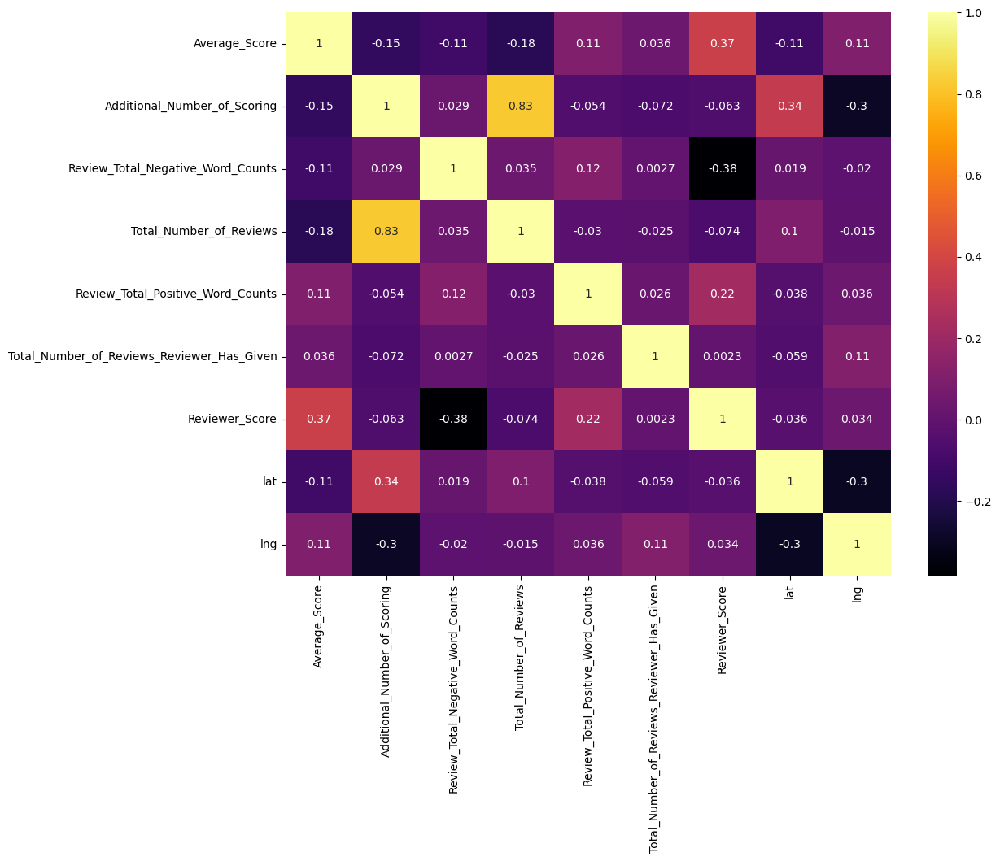

In [28]:
#Matiz de correlacion:
corr_df = df_hotel_reviews[['Average_Score','Additional_Number_of_Scoring','Review_Total_Negative_Word_Counts','Total_Number_of_Reviews','Review_Total_Positive_Word_Counts','Total_Number_of_Reviews_Reviewer_Has_Given','Reviewer_Score','lat','lng']]    
corr_df = corr_df.corr()

f,ax = plt.subplots(figsize=(12,9))

sns.heatmap(corr_df, cmap='inferno', annot=True)

In [49]:
sns.set_theme(style="ticks")
a=sns.pairplot(df_hotel_reviews)

KeyboardInterrupt: 

Error in callback <function flush_figures at 0x00000120A39F4C10> (for post_execute):


KeyboardInterrupt: 

C:\Users\franc\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.

C:\Users\franc\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.

C:\Users\franc\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.

C:\Users\franc\anaconda3\lib\site-packages\seaborn\_decorators.py:36: Future

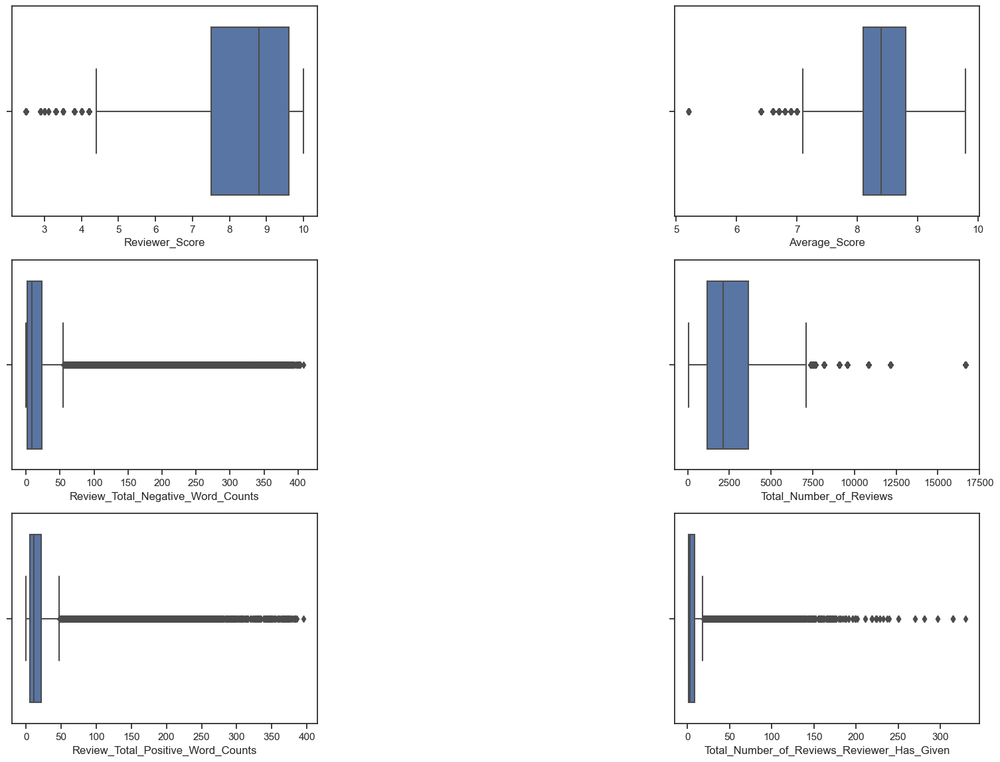

In [52]:
columnas = ['Reviewer_Score', 'Average_Score', 'Review_Total_Negative_Word_Counts', 'Total_Number_of_Reviews', 
           'Review_Total_Positive_Word_Counts', 'Total_Number_of_Reviews_Reviewer_Has_Given']
n = 1
plt.figure(figsize=(20,15))

for column in columnas:
  plt.subplot(4,4,n)
  n = n+2
  sns.boxplot(df_hotel_reviews[column])
  plt.tight_layout()